In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from IPython.display import display, clear_output
import concurrent.futures
import imageio
import os
from scipy.optimize import leastsq
from scipy.interpolate import interp2d
from matplotlib.colors import hsv_to_rgb

In [2]:
# Open the video file
cap = cv2.VideoCapture('../data/250hz_fan.mp4')
skip_frame = 10
light_field_num = 39

# Get the video frame dimensions
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create an empty list to store the video frames
frames = []

# Read the video frames one by one
while cap.isOpened():
    ret, frame = cap.read()
    if ret:
        # Append the current frame to the list of frames
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        # frame = np.fliplr(np.flipud(frame))
        frames.append(frame)
    else:
        break

# Release the video capture object
cap.release()

# Convert the list of frames to a NumPy array
video = np.stack(frames)
video = video[skip_frame:]

# Display the shape of the resulting array
print(video.shape)

(2263, 440, 300, 3)


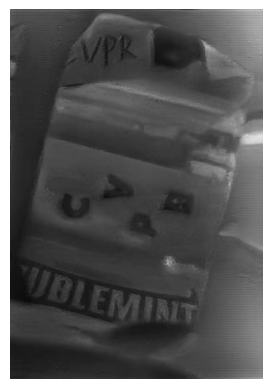

In [3]:
import matplotlib.animation as animation
from IPython.display import HTML

fig, ax = plt.subplots()

def update(frame):
    ax.clear()
    image = video[frame * light_field_num]
    ax.imshow(image)
    ax.axis('off')

ani = animation.FuncAnimation(fig, update, frames=video.shape[0]// light_field_num, interval= 10)

HTML(ani.to_jshtml())


/var/folders/vb/5ts99k7d0sq0rd4222dzfrsr0000gn/T/ipykernel_81812/3793106119.py:17: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  interp_img = interp2d(mesh_x, mesh_y, light_field_video[f, :, :, c].T)
/var/folders/vb/5ts99k7d0sq0rd4222dzfrsr0000gn/T/ipykernel_81812/3793106119.py:18: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code,

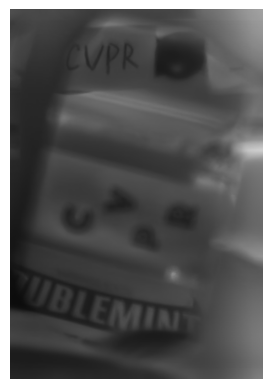

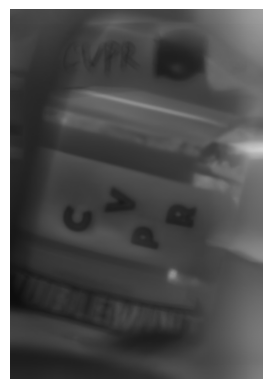

In [4]:
angles = np.linspace(2 * np.pi, 0, light_field_num, endpoint=False)
shift_on_circle = np.zeros((light_field_num, 2))

def process_frame(frame, radius):
    light_field_video = video[frame*light_field_num:(frame+1)*light_field_num]
    shift_on_circle = np.zeros((light_field_num, 2))
    start_offset = 0.92
    shift_on_circle[:, 0] = radius * np.cos(angles - start_offset * np.pi)
    shift_on_circle[:, 1] = radius * np.sin(angles - start_offset * np.pi)
    shift = shift_on_circle 
                
    final_image = np.zeros([light_field_video.shape[1], light_field_video.shape[2], 3])
    pad_image = np.zeros([light_field_video.shape[1], light_field_video.shape[2], 3])
    mesh_x, mesh_y = np.arange(0, light_field_video.shape[1]), np.arange(0, light_field_video.shape[2])
    for f in range(light_field_video.shape[0]):
        for c in range(3):
            interp_img = interp2d(mesh_x, mesh_y, light_field_video[f, :, :, c].T)
            pad_image[:, :, c] = interp_img(mesh_x + shift[f][0], mesh_y + shift[f][1]).T
        final_image += pad_image
    final_image = final_image / light_field_video.shape[0] / 255
    final_image = (final_image * 255).astype(np.uint8)
    return final_image

# Use ThreadPoolExecutor to parallelize the frame processing
frames_11 = [None] * (video.shape[0] // light_field_num)
frames_15 = [None] * (video.shape[0] // light_field_num)

def save_frames(frame):
    return (frame, process_frame(frame, 11.0), process_frame(frame, 15.3))

with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = [executor.submit(save_frames, frame) for frame in range(video.shape[0] // light_field_num)]
    for future in concurrent.futures.as_completed(futures):
        frame, image_11, image_15 = future.result()
        frames_11[frame] = image_11
        frames_15[frame] = image_15

# Create a animation
fig1, ax1 = plt.subplots()
fig2, ax2 = plt.subplots()

def update1(frame):
    ax1.clear()
    ax1.imshow(frames_11[frame])
    ax1.axis('off')

def update2(frame):
    ax2.clear()
    ax2.imshow(frames_15[frame])
    ax2.axis('off')

ani1 = animation.FuncAnimation(fig1, update1, frames=len(frames_11), interval=10)
ani2 = animation.FuncAnimation(fig2, update2, frames=len(frames_15), interval=10)

display(HTML(ani1.to_jshtml()))
display(HTML(ani2.to_jshtml()))

In [13]:
# THIS CODE IS ONLY FOR DETERMINING THE SHIFT OF THE START POINT
# YOU DON'T NEED TO RUN THIS CODE
# BUT YOU CAN TRY IF YOU WANT

angles = np.linspace(2 * np.pi, 0, light_field_num, endpoint=False)
shift_on_circle = np.zeros((light_field_num, 2))

def process_frame(frame):
    light_field_video = video[frame*light_field_num:(frame+1)*light_field_num]
    
    for start_offset in np.arange(0.0, 2.0, 0.01):  # Adjust the range and step as needed
        for radius in [11]: 
            
            shift_on_circle = np.zeros((light_field_num, 2))
            shift_on_circle[:, 0] = radius * np.cos(angles - start_offset * np.pi)
            shift_on_circle[:, 1] = radius * np.sin(angles - start_offset * np.pi)
            shift = shift_on_circle 

            final_image = np.zeros([light_field_video.shape[1], light_field_video.shape[2], 3])
            pad_image = np.zeros([light_field_video.shape[1], light_field_video.shape[2], 3])
            mesh_x, mesh_y = np.arange(0, light_field_video.shape[1]), np.arange(0, light_field_video.shape[2])
            for f in range(light_field_video.shape[0]):
                for c in range(3):
                    interp_img = interp2d(mesh_x, mesh_y, light_field_video[f, :, :, c].T)
                    pad_image[:, :, c] = interp_img(mesh_x + shift[f][0], mesh_y + shift[f][1]).T
                final_image += pad_image
            final_image = final_image / light_field_video.shape[0] / 255
            final_image = (final_image * 255).astype(np.uint8)
            imageio.imwrite(f"../result_for_code_test/tmp_radius_{radius:.1f}_start_shift_{start_offset:.2f}_frame_{frame}.png", final_image)

with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = [executor.submit(process_frame, frame) for frame in range(0,1)]
    concurrent.futures.wait(futures)

/var/folders/vb/5ts99k7d0sq0rd4222dzfrsr0000gn/T/ipykernel_81405/1746968251.py:23: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  interp_img = interp2d(mesh_x, mesh_y, light_field_video[f, :, :, c].T)
/var/folders/vb/5ts99k7d0sq0rd4222dzfrsr0000gn/T/ipykernel_81405/1746968251.py:24: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code,